# Scientific Programming coursework

The simulation can be loaded into this notebook to view the initial  output visualisation. Click restart and run all cells for parts 1,2 and 3. The notebook will take a few minutes to complete.

## Part 1 - The forest fire model 

Demonstrating the module import of the forest fire model.
Please load and use the help function for more information on each function.

In [1]:
import forest_simulation_v2

SUCCESS - 
Simulation for 500 steps, with an array size of (20, 20) has completed.
Figure named Forest_fire_simulation_steady_state has been created. 
Please move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. 
A compressed file called forest_simulation_new.npz is also available
The growth rate is 0.05 and the lightning rate is 0.01


A randomly generated grid is initialised by forest_simulation_v2.

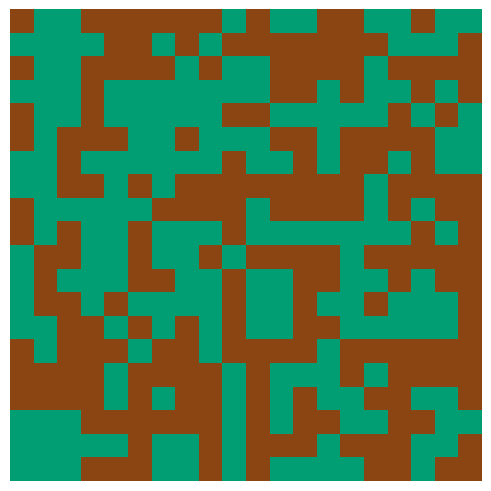

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import numpy as np

with np.load("forest_simulation_new.npz") as f:
    cells = f["state"]

# Set up the initial figure and axes
fig, ax = plt.subplots(constrained_layout=True)
ax.axis("off")

#cmap = ListedColormap(["#029e73", "#de8f05"])
cmap = ListedColormap(["saddlebrown", "#029e73", "#de8f05"])

# Plot the initial grid
array_plot = ax.imshow(
    cells[0,:,:],  # Make our data 2-D
    vmin=cells.min(),
    vmax=cells.max(),
    animated=True,
    cmap=cmap
)

### Animation 

Animations can be looped over this grid which provide insight and testing of the simulation rules.

Please click on the interactive menu below to run the simulation.


In [2]:
def animate(i):
    array_plot.set_array(cells[i,:,:])
    return array_plot


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Create an animation object which:
# - animate the Figure, `fig`
# - using the function `animate`
# - for len(cells) number of frames
# - where each frame lasts 100 milliseconds
anim = FuncAnimation(fig, animate, frames=len(cells), interval=100)
# Display the animation in the notebook
HTML(anim.to_jshtml())

Animation 1 - There is a spread of fire throughout the trees in this beta forest fire model but there does seem to be a lot of empty cells.

## Part 2 - Steady-state investigation

To experiment with creating a steady state and any parameter relationships, it is useful to run simulations through this notebook. The following numbered parameters can be changed manually via f (lightning) an p (growth) to give different outputs.

1) Growth rate
1) Lightning rate
1) Number of steps and array size
1) The initial state of the array. (default random)

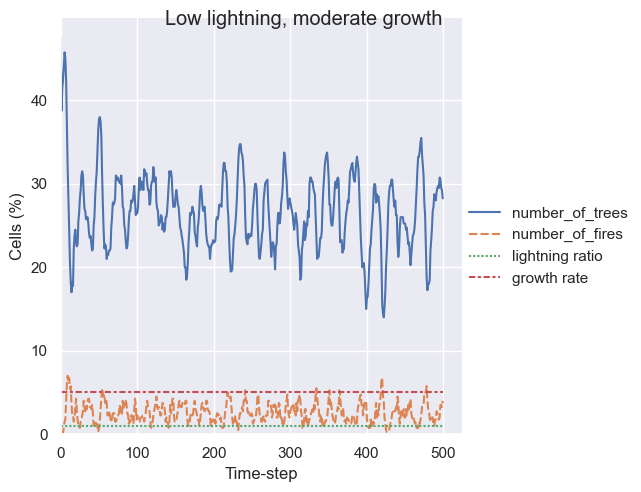

In [1]:
import numpy as np

with np.load("forest_simulation_new.npz") as f:
    cells = f["state"]

# 1) growth (re-assign for numpy plot)
p = 0.05
# 2) lightning
f = 0.01 

# loop to append array proportions 
trees_count = []
fires_count = []
light_count = []
growth_count = []
total = np.count_nonzero(cells[0]) 

for time_step_state in cells:
    #tree percentage and append
    trees = np.count_nonzero(time_step_state == 2) / total * 100
    trees_count.append(trees)
    #fires percentage and append
    fires = np.count_nonzero(time_step_state == 3) / total * 100
    fires_count.append(fires)
    #lightning positive at 0 index
    light = f * 100
    light_count.append(light)
    #growth at at index 1
    growth_rate = p * 100
    growth_count.append(growth_rate)

    
######### create a pandas data frame.
import pandas as pd

summary = pd.DataFrame({"number_of_trees": trees_count,
                        "number_of_fires": fires_count,
                        "lightning ratio": light_count,
                        "growth rate"    : growth_count
                       }
                      )
summary.index.name = "Time step"

######### Plot this data frame with seaborn.

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()

g = sns.relplot(data=summary, kind="line").set(
    xlim=(0,None),
    ylim=(0,None),
)
g.set_axis_labels("Time-step", "Cells (%)")
g.fig.suptitle( "Low lightning, moderate growth")

#allows for re-running visualisation repeatly.
plt.show()



Figure 1. - This simulation has come very close to a steady state and does not fall below the lightning ratio very often.

### Growth rate and lightning relationship

This section analyses the impact of the two parameters, growth rate and lightning rate.
 

### Lowering the lightning rate

The forest simulation function can be called from the module and parameters changed.


In [2]:
#### Run simulation :::::::::::::::::::
import numpy as np
from numpy.random import default_rng
import forest_simulation_v2
rng = default_rng()
# 1) growth (parameter change)
p = 0.05
# 2) lightning
f = 0.001
# Steps and array size
num_steps = 500
array_size = (100,100)

initial_state = rng.integers(low=1, high=2, endpoint =True, size=array_size)

# generate a 3D numpy array for each state
forest_state = forest_simulation_v2.run_simulation(num_steps, array_size, initial_state)


#save compressed folder for analysis
filename = "forest_simulation_steady_state_analysis_1"
np.savez_compressed(filename, state=forest_state)
print(f"SUCCESS - \nSimulation {filename}, for {num_steps} steps, with an array size of {array_size} has completed")
print(f"The growth rate is {p} and the lightning rate is {f}")


SUCCESS - 
Simulation for 500 steps, with an array size of (20, 20) has completed.
Figure named Forest_fire_simulation_steady_state has been created. 
Please move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. 
A compressed file called forest_simulation_new.npz is also available
The growth rate is 0.05 and the lightning rate is 0.01
SUCCESS - 
Simulation forest_simulation_steady_state_analysis_1, for 500 steps, with an array size of (100, 100) has completed
The growth rate is 0.05 and the lightning rate is 0.001


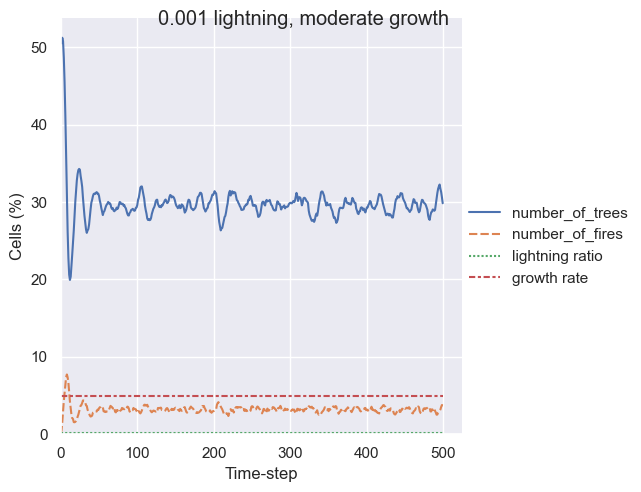

In [3]:
import numpy as np

with np.load("forest_simulation_steady_state_analysis_1.npz") as f:
    cells = f["state"]

##growth (reload prob out of compression.)
p = 0.05

#lightning
f = 0.001 

# loop to append array proportions 
trees_count = []
fires_count = []
light_count = []
growth_count = []
total = np.count_nonzero(cells[0]) 

for time_step_state in cells:
    #tree percentage and append
    trees = np.count_nonzero(time_step_state == 2) / total * 100
    trees_count.append(trees)
    #fires percentage and append
    fires = np.count_nonzero(time_step_state == 3) / total * 100
    fires_count.append(fires)
    #lightning positive at 0 index
    light = f * 100
    light_count.append(light)
    #growth at at index 1
    growth_rate = p * 100
    growth_count.append(growth_rate)

    
######### create a pandas data frame.
import pandas as pd

summary = pd.DataFrame({"number_of_trees": trees_count,
                        "number_of_fires": fires_count,
                        "lightning ratio": light_count,
                        "growth rate"    : growth_count
                       }
                      )
summary.index.name = "Time step"

######### Plot this data frame with seaborn.

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()

g = sns.relplot(data=summary, kind="line").set(
    xlim=(0,None),
    ylim=(0,None),
)
g.set_axis_labels("Time-step", "Cells (%)")
g.fig.suptitle( "0.001 lightning, moderate growth")

#allows for re-running visualisation repeatly.
plt.show()



Figure 2. Steady state of cell proportions overtime.

Lets plot and animate this wider simulation grid with lower f probability.

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import numpy as np

with np.load("forest_simulation_steady_state_analysis_1.npz") as f:
    cells = f["state"]

# Set up the initial figure and axes
fig, ax = plt.subplots(constrained_layout=True)
ax.axis("off")

#cmap = ListedColormap(["#029e73", "#de8f05"])
cmap = ListedColormap(["saddlebrown", "#029e73", "#de8f05"])

# Plot the initial grid
array_plot = ax.imshow(
    cells[0,:,:],  # Make our data 2-D
    vmin=cells.min(),
    vmax=cells.max(),
    animated=True,
    cmap=cmap
)

In [8]:
def animate(i):
    array_plot.set_array(cells[i,:,:])
    return array_plot


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Create an animation object which:
# - animate the Figure, `fig`
# - using the function `animate`
# - for len(cells) number of frames
# - where each frame lasts 100 milliseconds
anim = FuncAnimation(fig, animate, frames=len(cells), interval=100)
# Display the animation in the notebook
HTML(anim.to_jshtml())

Animation 2.  A steady state has been achieved by lowering the probability of lightning significantly. The grid size of (100,100) provides a better visualisation of the animation.

### Tree extinction

Tree extinction with no growth rate is a good test of the simulation. (manual reloading required)


In [9]:
import numpy as np
from numpy.random import default_rng
rng = default_rng()


#define functions to apply rules :::::::::::::::::::::::

def initialise_state(num_steps, array_size, initial_state):
    #history = np.zeros((5 *num_steps ,array_size), dtype=int)
    #create the array to hold the simulation based on the number of steps
    initial_state = rng.integers(low=1, high=2, endpoint =True, size=(array_size))
    return initial_state

EMPTY = 1
TREE = 2
FIRE = 3
            
def update_state(previous_grid): 
    #create new grid for next step
    new_grid = np.zeros_like(previous_grid)

    #RULE 1 - if cell = 3 it changes to 1 :::::::::::::::::::::::::::::::::::::::::::::::
    for (x,y), value in np.ndenumerate(previous_grid):
        if value == 3:
            new_grid[x,y] = EMPTY
            #cell remains unchanged if not 3  
        else:
            new_grid[x,y] = value

    #RULE 2 - Neighbouring cells to (3) that are trees (2) BURN (3) ::::::::::::::::::::::
    # default burn value
    
    for (x,y), value in np.ndenumerate(previous_grid):
        
        #assign edges rules foro better readability.
        deforest_above = x - 1 < 0
        deforest_below = x + 1 == previous_grid.shape[0]
        deforest_left =  y + 1 == previous_grid.shape[1]
        deforest_right = y - 1 < 0

        if deforest_above or  deforest_below or deforest_left or deforest_right:
            new_grid[x,y] = 1 # deforestation at the edges of the forest
            
        elif value == 3:
            burn_cell = 3
            new_grid[x,y] = 1
            if previous_grid[x-1,y] == 2:
                new_grid[x-1,y] = burn_cell

            if previous_grid[x+1,y] == 2:
                new_grid[x+1,y] = burn_cell

            if previous_grid[x,y-1] == 2:
                new_grid[x,y-1] = burn_cell = 3

            if previous_grid[x,y+1] == 2:
                 new_grid[x,y+1]= burn_cell = 3
                    
        elif value == 2 and np.random.random() <= f:
            new_grid[x,y] = FIRE
            
        elif value == 1 and np.random.random() <= p:
            new_grid[x,y] = TREE
    
    
    
    #add in function to apply random lightning
    #lightning(new_grid)
    #add function to apply random growth
    #growth(new_grid)
    
    return new_grid




def run_simulation(num_steps, array_size, initial_state):
    #create inital state
    state = initialise_state(num_steps, array_size, initial_state)
    history = []
    #append the empty list with the inital state
    history.append(state)
    
    for t in range(1,num_steps):
    #print(f" step: {i}")
    #print(update_state(history[i-1]))   
    #Reference previous time step in the list
        history.append(update_state(history[t-1]))
    #convert list to numpy array
        simulation = np.asarray(history)
        
    return simulation



#### Run simulation :::::::::::::::::::

##growth
p = 0
#lightning
f = 0.01
# Steps and array size
num_steps = 500
array_size = (20,20)

initial_state = rng.integers(low=1, high=2, endpoint =True, size=array_size)


#4) set random array - code limitation this should be done in function.
#initial_state = rng.integers(low=1, high=2, endpoint =True, size=array_size)

# generate a 3D numpy array for each state
forest_state = run_simulation(num_steps, array_size, initial_state)

#save compressed folder for analysis
filename = "forest_simulation_test_ext"
np.savez_compressed(filename, state=forest_state)


print(f"SUCCESS - \nSimulation for {num_steps} steps, with an array size of {array_size} has completed.\nFigure named Forest_fire_simulation_steady_state has been created. \nPlease move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. \nA compressed file called {filename}.npz is also available")
print(f"The growth rate is {p} and the lightning rate is {f}")

SUCCESS - 
Simulation for 500 steps, with an array size of (20, 20) has completed.
Figure named Forest_fire_simulation_steady_state has been created. 
Please move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. 
A compressed file called forest_simulation_test_ext.npz is also available
The growth rate is 0 and the lightning rate is 0.01


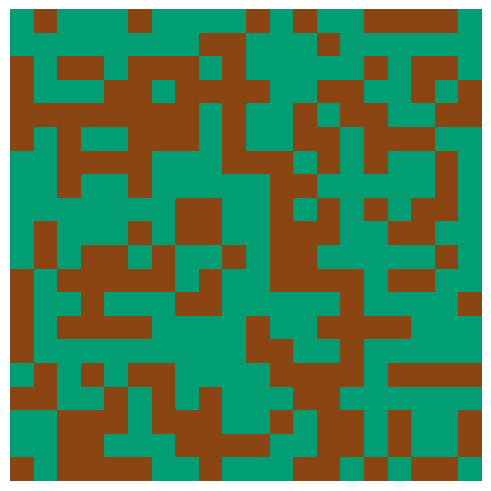

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import numpy as np

with np.load("forest_simulation_test_ext.npz") as f:
    cells = f["state"]

# Set up the initial figure and axes
fig, ax = plt.subplots(constrained_layout=True)
ax.axis("off")

#cmap = ListedColormap(["#029e73", "#de8f05"])
cmap = ListedColormap(["saddlebrown", "#029e73", "#de8f05"])

# Plot the initial grid
array_plot = ax.imshow(
    cells[0,:,:],  # Make our data 2-D
    vmin=cells.min(),
    vmax=cells.max(),
    animated=True,
    cmap=cmap
)

In [11]:
def animate(i):
    array_plot.set_array(cells[i,:,:])
    return array_plot


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Create an animation object which:
# - animate the Figure, `fig`
# - using the function `animate`
# - for len(cells) number of frames
# - where each frame lasts 100 milliseconds
anim = FuncAnimation(fig, animate, frames=len(cells), interval=100)
# Display the animation in the notebook
HTML(anim.to_jshtml())

Animation 3 - Presents an extinction event which is a sufficient test of rules where growth rate is 0, you expect extinction.

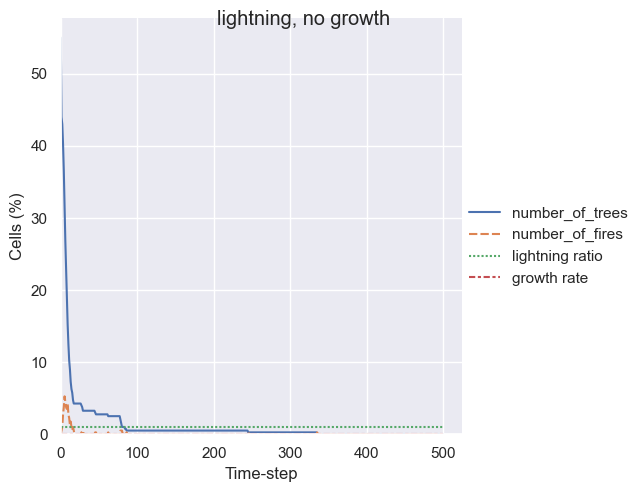

In [12]:
#### Analyse the results
import numpy as np

with np.load("forest_simulation_test_ext.npz") as f:
    cells = f["state"]

##growth
p = 0

#lightning
f = 0.01


    
trees_count = []
fires_count = []
light_count = []
growth_count = []
total = np.count_nonzero(cells[0]) 

for time_step_state in cells:
    #tree percentage and append
    trees = np.count_nonzero(time_step_state == 2) / total * 100
    trees_count.append(trees)
    #fires percentage and append
    fires = np.count_nonzero(time_step_state == 3) / total * 100
    fires_count.append(fires)
    #lightning positive at 0 index
    light = f * 100
    light_count.append(light)
    #growth at at index 1
    growth_rate = p * 100
    growth_count.append(growth_rate)

    
#########
import pandas as pd

summary = pd.DataFrame({"number_of_trees": trees_count,
                        "number_of_fires": fires_count,
                        "lightning ratio": light_count,
                        "growth rate"    : growth_count
                       }
                      )
summary.index.name = "Time step"

#########

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()

g = sns.relplot(data=summary, kind="line").set(
    xlim=(0,None),
    ylim=(0,None),
)
g.set_axis_labels("Time-step", "Cells (%)")
g.fig.suptitle( "lightning, no growth")

#allows for re-running visualisation repeatly.
plt.show()

Figure 3. Tree extinction does when the growth rate is zero.

### Conclusion 



The forest model created here does show some visual spread of fire in the animations and a steady state can be achieved (figure 2.0). Some testing of rules does show tree extinction when growth is set to zero. Further investigations and programming is required to improve reproducibility.

## Part 3 - Additional Model features

1. A corporate agriculture firm has decided to burn the outer edges of the forest with its waste products.
     1. For each time step the edges will be set to 2. 


1. Evolutionary pressure within the metaverse proposedly due to Bristol Bioinformatics student's running repeated forest fire simulations late into the night has resulted in a novel speciation event of fire resistant trees.  

    1. Fire resistant trees grow at a similar rate to trees (3) from blank cells (1). and do not burn like usual trees.  


1. A global conglomerate aptly named Shamazon has decided to brave the forest to mine the new species for its fire resistant protein, which has great applications within the tech and cloud computing industry. 
    1. The new species (5) is mined at a 0.01 ratio. Any mining creates a new blank cell(1).


### Corporate forest burning

SUCCESS - 
Simulation attack_forest_simulation for 500 steps, with an array size of (20, 20) has completed.
Figure named Forest_fire_simulation_steady_state has been created. 
Please move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. 
A compressed file called attack_forest_simulation.npz is also available
The growth rate is 0.05 and the lightning rate is 0.8


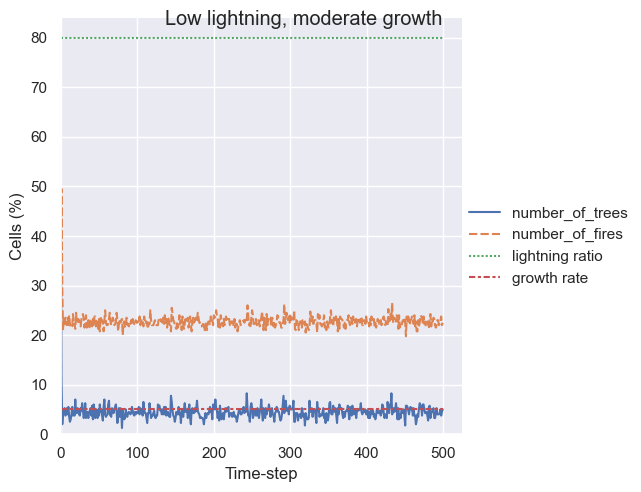

In [13]:
import forest_simulation_attack

Figure 4. This figure presents a dramatic drop in tree proportion due to extra burning and higher fire rate.

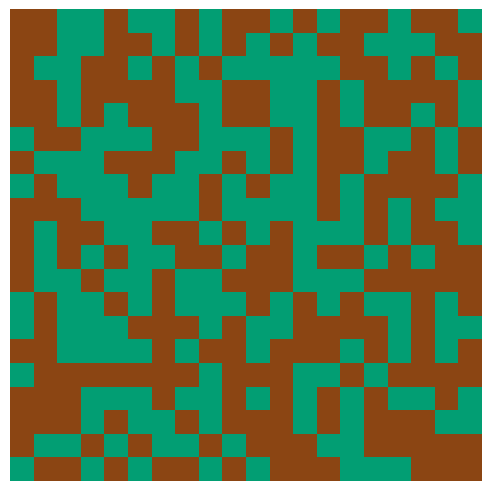

In [14]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import numpy as np

with np.load("attack_forest_simulation.npz") as f:
    cells = f["state"]

# Set up the initial figure and axes
fig, ax = plt.subplots(constrained_layout=True)
ax.axis("off")

#cmap = ListedColormap(["#029e73", "#de8f05"])
cmap = ListedColormap(["saddlebrown", "#029e73", "#de8f05"])

# Plot the initial grid
array_plot = ax.imshow(
    cells[0,:,:],  # Make our data 2-D
    vmin=cells.min(),
    vmax=cells.max(),
    animated=True,
    cmap=cmap
)

In [15]:
def animate(i):
    array_plot.set_array(cells[i,:,:])
    return array_plot


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Create an animation object which:
# - animate the Figure, `fig`
# - using the function `animate`
# - for len(cells) number of frames
# - where each frame lasts 100 milliseconds
anim = FuncAnimation(fig, animate, frames=len(cells), interval=100)
# Display the animation in the notebook
HTML(anim.to_jshtml())

Animation 4. Realistically presents that additional burning activity at the edges greatly reduced tree growth, turning the forest into a barren wasteland.

### Hypothesis - The evolution of fire resistant trees


__Null__ - There will be no change in original tree growth with the added parameters.  
__Alternative__ - The new species will out compete the old tree due to its fire resistant properties.

In [16]:
import evolution_forest_simulation

SUCCESS - 
Simulation for 500 steps, with an array size of (20, 20) has completed.
Figure named Forest_fire_simulation_steady_state has been created. 
Please move on to the jupypter notebook to visualise the simulation and different parameters more reproducibly. 
A compressed file called evolution_forest_simulation_new.npz is also available
The growth rate is 0.1 and the lightning rate is 0.01


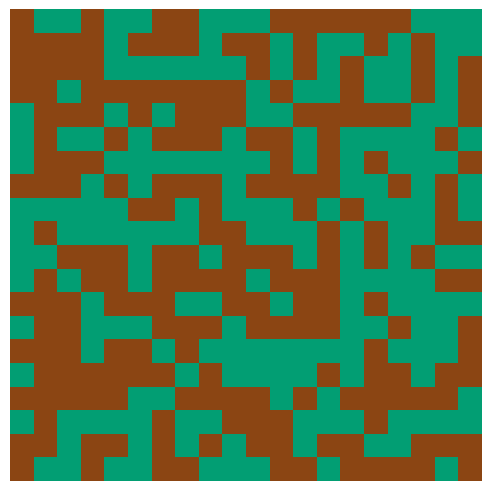

In [17]:
with np.load("evolution_forest_simulation_new.npz") as f:
    cells = f["state"]

# Set up the initial figure and axes
fig, ax = plt.subplots(constrained_layout=True)
ax.axis("off")

#cmap = ListedColormap(["#029e73", "#de8f05"])
cmap = ListedColormap(["saddlebrown", "#029e73", "#de8f05","cadetblue"])

# Plot the initial grid
array_plot = ax.imshow(
    cells[0,:,:],  # Make our data 2-D
    vmin=cells.min(),
    vmax=cells.max(),
    animated=True,
    cmap=cmap
)

In [18]:
def animate(i):
    array_plot.set_array(cells[i,:,:])
    return array_plot


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Create an animation object which:
# - animate the Figure, `fig`
# - using the function `animate`
# - for len(cells) number of frames
# - where each frame lasts 100 milliseconds
anim = FuncAnimation(fig, animate, frames=len(cells), interval=100)
# Display the animation in the notebook
HTML(anim.to_jshtml())

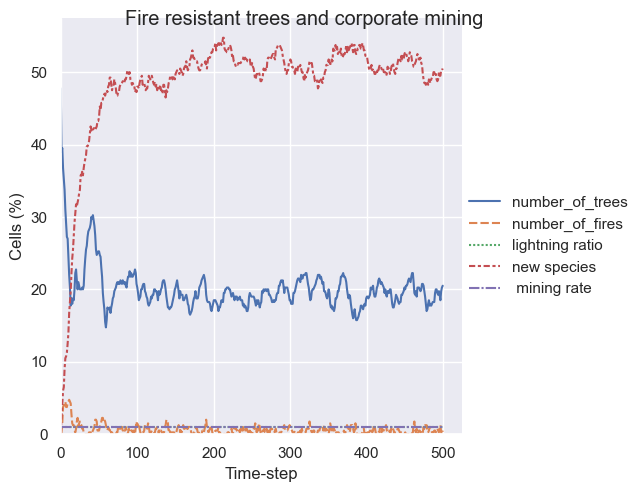

In [19]:
#### Analyse the results
import numpy as np

with np.load("evolution_forest_simulation_new.npz") as f:
    cells = f["state"]

##growth
p = 0.1

#growth of new tree
pn = 0.01

#lightning
f = 0.01
    
trees_count = []
fires_count = []
light_count = []
growth_count = []
species_count = []
mining_count = []
total = np.count_nonzero(cells[0]) 

for time_step_state in cells:
    
    #Count fire resistant tree species
    species = np.count_nonzero(time_step_state == 5) / total * 100
    species_count.append(species) 
    
    #tree percentage and append
    trees = np.count_nonzero(time_step_state == 2) / total * 100
    trees_count.append(trees)
    #fires percentage and append
    fires = np.count_nonzero(time_step_state == 3) / total * 100
    fires_count.append(fires)
    #lightning positive at 0 index
    light = f * 100
    light_count.append(light)
    #growth
    growth_rate = p * 100
    growth_count.append(growth_rate)
    #mining rate
    mining = pn * 100
    mining_count.append(mining)
    

    
#########
import pandas as pd

summary = pd.DataFrame({"number_of_trees": trees_count,
                        "number_of_fires": fires_count,
                        "lightning ratio": light_count,
                        "new species"    :species_count,
                        " mining rate"   :mining_count
                       }
                      )
summary.index.name = "Time step"

#########

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()

g = sns.relplot(data=summary, kind="line").set(
    xlim=(0,None),
    ylim=(0,None),
)
g.set_axis_labels("Time-step", "Cells (%)")
g.fig.suptitle('Fire resistant trees and corporate mining')

#allows for re-running visualisation repeatly.
plt.show()

Figure 5. This figure confirms the alternative hypothesis that the original tree species (3) will become a less abundant species in the forest.

 # Testing 
 Please refer to the read me file for pytest information which can be run in the terminal.